# Social Distancing Tool

In [1]:
# Install dependencies 
!pip install pyyaml==5.1
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

     |████████████████████████████████| 276kB 8.8MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44091 sha256=41dbfb2f3f99a4fbacadc9aee1569a23b101b91026d7d9a9cd25b2903b4e8fdc
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
     |████████████████████████████████| 6.2MB 4.2MB/s 
     |████████████████████████████████| 51kB 8.1MB/s 
     |████████████████████████████████| 81kB 11.9MB/s 
     |████████████████████████████████| 112kB 47.1MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.3.post20210317-cp37-none-any.whl size=58543 sha256=d43db331b47f2de5dde74de2e0ec331a2b3e7a12ce717512294da97d0a8e4636
  Stored in directory: /root/.cache/pip/wheels/d2/ee/3a/5c53

In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")

1.8.1+cu101 True


In [ ]:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# Import some common libraries
import numpy as np
import os, re, json, cv2, random, glob
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from scipy.spatial import distance
import pandas as pd

# Import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
if os.path.exists(directory):
    frs = glob.glob('./frame/*.png')
    for f in frs:
        os.remove(f)
else:
    os.makedirs(directory)

In [ ]:
# Specify path to video
video = './sample1_wo_sound.mp4'

cap = cv2.VideoCapture(video)
cnt = 0

# Check if video file is opened successfully
if (cap.isOpened()== False): 
    print("Error opening video stream or file")

ret, first_frame = cap.read()

# Read until video is completed
while(cap.isOpened()):
    
    # Capture frame-by-frame
    ret, frame = cap.read()
        
    if ret == True:

    # Save each frame to folder        
    cv2.imwrite('frames/' + str(cnt) + '.png', frame)
    cnt = cnt + 1
    if(cnt == 750):
        break

    # Break the loop
    else: 
    break

In [ ]:
# Frame rate of a video
FPS = cap.get(cv2.CAP_PROP_FPS)
print(FPS)

29.97002997002997


In [ ]:
## Download the pre-trained model for object detection from Detectron 2’s model zoo and then the model is ready for inference
cfg = get_cfg()

# Add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9

# Find a model from detectron2's model zoo. 
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml")
predictor = DefaultPredictor(cfg)

model_final_f97cb7.pkl: 136MB [00:01, 74.4MB/s]                           


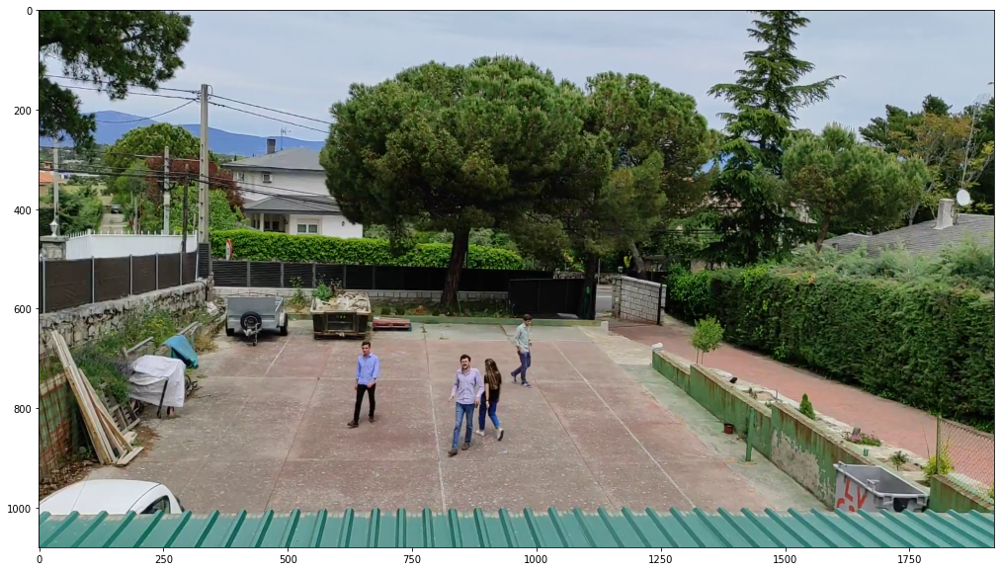

In [ ]:
img = cv2.imread('frames/330.png')

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [ ]:
# Read an image
img = cv2.imread("frames/330.png")

# Pass to the model
outputs = predictor(img)

In [ ]:
# Use `Visualizer` to draw the predictions on the image.
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
# Identity only persons 
classes = outputs['instances'].pred_classes.cpu().numpy()
bbox = outputs['instances'].pred_boxes.tensor.cpu().numpy()

ind = np.where(classes == 0)[0]

# Identify bounding box of only persons
person = bbox[ind]

# Total no. of persons
num = len(person)
print(num)

5


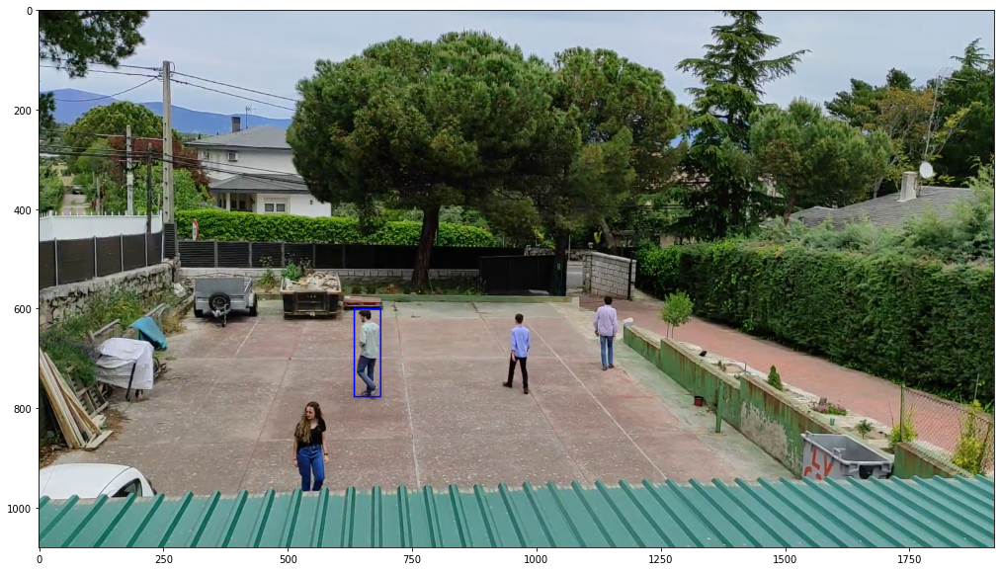

In [ ]:
# Draw a bounding boz for one of the persons
x1, y1, x2, y2 = person[0]

img = cv2.imread('frames/30.png')
_ = cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

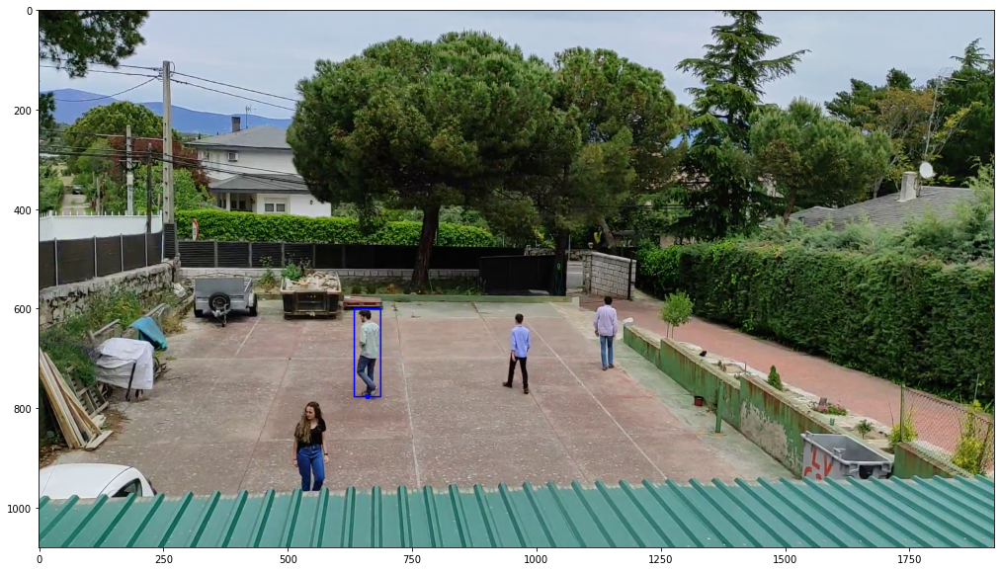

In [ ]:
#compute center 
x_center = int((x1+x2)/2)
y_center = int(y2)

center = (x_center, y_center)

_ = cv2.circle(img, center, 5, (255, 0, 0), -1)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [ ]:
def mid_point(img,person,idx):
    '''
    Define a function which return the bottom center of every bbox
    '''
    # Get the coordinates
    x1, y1, x2, y2 = person[idx]
    # Compute bottom center of bbox
    x_mid = int((x1 + x2) / 2)
    y_mid = int(y2)
    mid = (x_mid, y_mid)

    return mid

def draw_bboxes(img,person, idx, color=(0,0,255)):
    '''
    Define a function which draw the bounding boxes
    '''
    # Get the coordinates
    x1, y1, x2, y2 = person[idx]
    _ = cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

    # Compute bottom center of bbox
    x_mid = int((x1 + x2) / 2)
    y_mid = int(y2)
    mid = (x_mid, y_mid)

    _ = cv2.circle(img, mid, 5, color, -1)

    return None

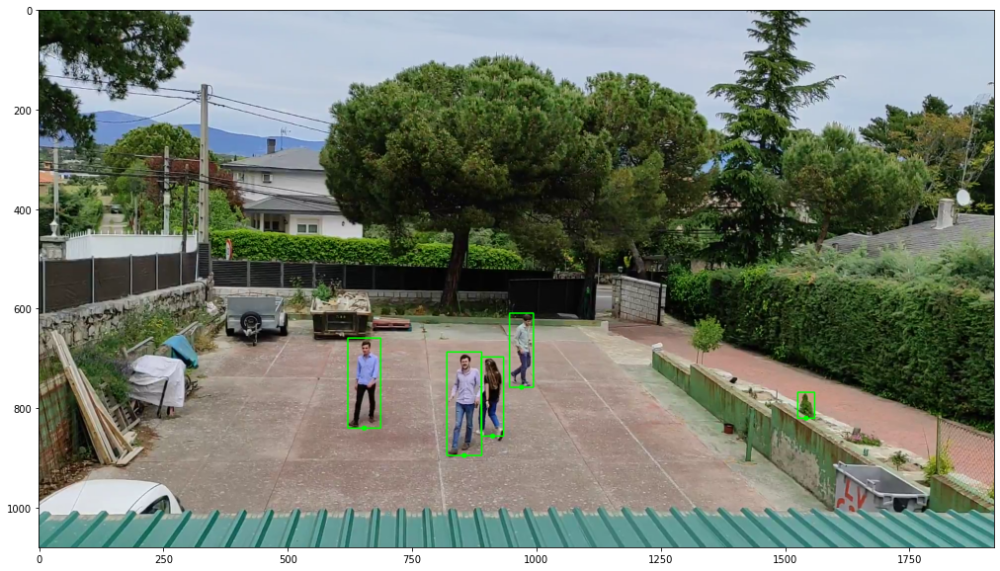

In [ ]:
midpoints = [mid_point(img,person,i) for i in range(len(person))]
_ = [draw_bboxes(img, person, i, color=(0,255,0)) for i in range(len(person))]

# Visualize image
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [ ]:
def four_point_transform(image, pts):
    '''
    Define a function which compute the homography transformation matrix
    '''
	# Obtain a consistent order of the points and unpack them individually
	(tl, tr, br, bl) = pts

	# Compute the width of the new image, which will be the
	# maximum distance between bottom-right and bottom-left
	# x-coordiates or the top-right and top-left x-coordinates
	widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
	widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
	maxWidth = max(int(widthA), int(widthB))
 
	# Compute the height of the new image, which will be the
	# maximum distance between the top-right and bottom-right
	# y-coordinates or the top-left and bottom-left y-coordinates
	heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
	heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
	maxHeight = max(int(heightA), int(heightB))
 
	# Construct the set of destination points to obtain a "birds eye view"
	dst = np.array([
		[0, 0],
		[maxWidth - 1, 0],
		[maxWidth - 1, maxHeight - 1],
		[0, maxHeight - 1]], dtype = "float32")
 
	# Compute the perspective transform matrix and then apply it
	M = cv2.getPerspectiveTransform(pts, dst)
	warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))

	return M, warped

In [ ]:
real_dist_m = [13.15, 9.86] # [Height, Width] In meters
thresh = 1.5 # In meters

In [ ]:
# Define the points in the image that crop the work field
pts = np.zeros((4, 2), dtype = "float32")
pts[0] = np.array([330, 650], dtype = "float32")
pts[1] = np.array([1100, 650], dtype = "float32")
pts[2] = np.array([1600, 1000], dtype = "float32")
pts[3] = np.array([0, 1000], dtype = "float32")

pts

array([[ 330.,  650.],
       [1100.,  650.],
       [1600., 1000.],
       [   0., 1000.]], dtype=float32)

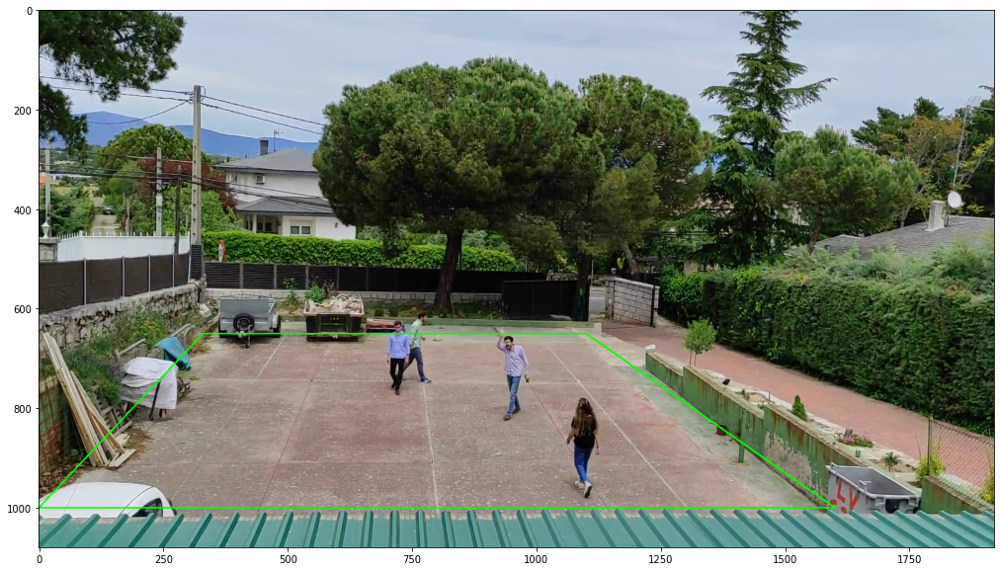

In [ ]:
img_aux = cv2.imread("frames/250.png")
cv2.line(img_aux, tuple(pts[0]), tuple(pts[1]), (0, 255, 0), thickness=2)
cv2.line(img_aux, tuple(pts[1]), tuple(pts[2]), (0, 255, 0), thickness=2)
cv2.line(img_aux, tuple(pts[2]), tuple(pts[3]), (0, 255, 0), thickness=2)
cv2.line(img_aux, tuple(pts[3]), tuple(pts[0]), (0, 255, 0), thickness=2)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_aux, cv2.COLOR_BGR2RGB))

(284, 256, 3)


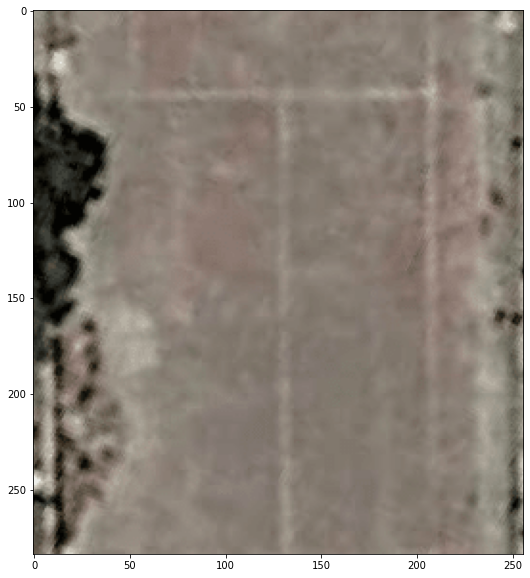

In [ ]:
# Load the reference image to have a clean frame of the work field
ground_img = cv2.imread("custom_video/capture_maps.png")

print(ground_img.shape)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(ground_img, cv2.COLOR_BGR2RGB))

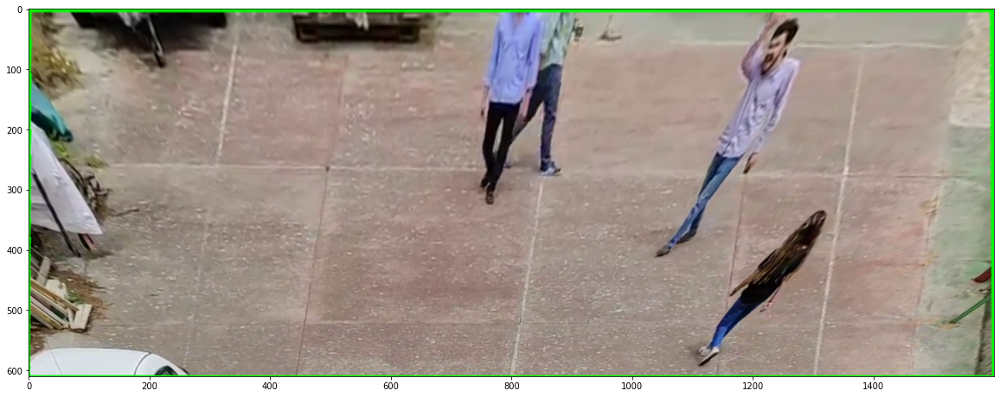

In [ ]:
# Visualize the transformed image
matrix, warped = four_point_transform(img_aux, pts)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))

In [ ]:
def compute_point_perspective_transformation(matrix, list_downoids):
    '''
    Define a function that apply the perspective transformation to every 
    ground point which have been detected on the main frame.
    '''
    # Compute the new coordinates of our points
    list_points_to_detect = np.float32(list_downoids).reshape(-1, 1, 2)
    transformed_points = cv2.perspectiveTransform(list_points_to_detect, matrix)

    # Loop over the points and add them to the list that will be returned
    transformed_points_list = list()
    for i in range(0,transformed_points.shape[0]):
        transformed_points_list.append([transformed_points[i][0][0],transformed_points[i][0][1]])

    return transformed_points_list

In [ ]:
# Compute the transformed points of the locations 
transformed_points = compute_point_perspective_transformation(matrix, midpoints)
transformed_points

[[659.13837, 433.3708],
 [1155.9958, 293.02],
 [894.7772, 504.87045],
 [986.23395, 455.69925],
 [1870.4327, 403.42914]]

In [ ]:
def map_point(value, leftMin, leftMax, rightMin, rightMax, integer=True):
    '''
    Define a function that map point from an input range to an output range
    '''
    # Figure out how 'wide' each range is
    leftSpan = leftMax - leftMin
    rightSpan = rightMax - rightMin

    # Convert the left range into a 0-1 range (float)
    valueScaled = float(value - leftMin) / float(leftSpan)

    # Convert the 0-1 range into a value in the right range.
    if integer:
        return int(rightMin + (valueScaled * rightSpan))
    else:
        return rightMin + (valueScaled * rightSpan)

def map_locations(pt, source_max_heigh, source_max_width, target_max_heigh, target_max_width, integer=True):
    '''
    Define a function that maps locations (x, y) from an input range to an output range
    '''
    pt[0] = map_point(pt[0], 0, source_max_width, 0, target_max_width, integer)
    pt[1] = map_point(pt[1], 0, source_max_heigh, 0, target_max_heigh, integer)

    return pt

In [ ]:
# Compute the corresponding pixels in the image per real meters
pixels_per_meter = round(np.mean([ground_img.shape[0] / real_dist_m[0], ground_img.shape[1] / real_dist_m[1]]))
pixels_per_meter

24

In [ ]:
# Map the points from the transformed image from the homography to the reference ground_img
transformed_points_ground = []
for p in transformed_points:
    print(p)
    transformed_points_ground.append(map_locations(p, *warped.shape[:2], *ground_img.shape[:2]))

transformed_points_ground

[659.13837, 433.3708]
[1155.9958, 293.02]
[894.7772, 504.87045]
[986.23395, 455.69925]
[1870.4327, 403.42914]


[[105, 201], [184, 136], [143, 235], [157, 212], [299, 187]]

[105, 201]
[184, 136]
[143, 235]
[157, 212]
[299, 187]


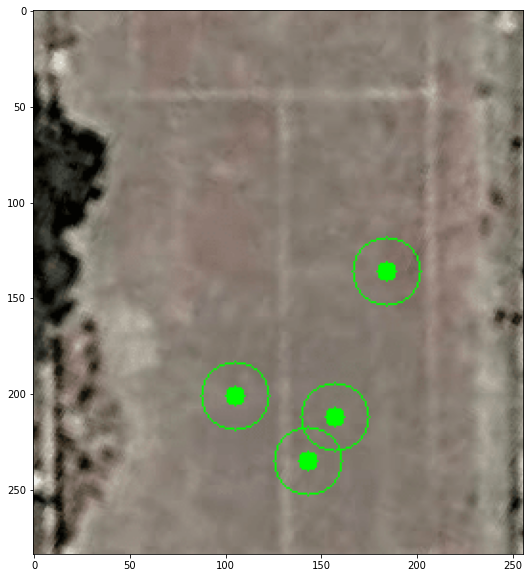

In [ ]:
# Check if 2 or more people have been detected (otherwise no need to detect)
if len(transformed_points) >= 2:
    for p in transformed_points:
        print(p)
        cv2.circle(ground_img, (p[0], p[1]), radius=5, color=(0, 255, 0), thickness=-1)
        cv2.circle(ground_img, (p[0], p[1]), radius=int(pixels_per_meter * (thresh / 2)), color=(0, 255, 0), thickness=1)

# Visualize image
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(ground_img, cv2.COLOR_BGR2RGB))

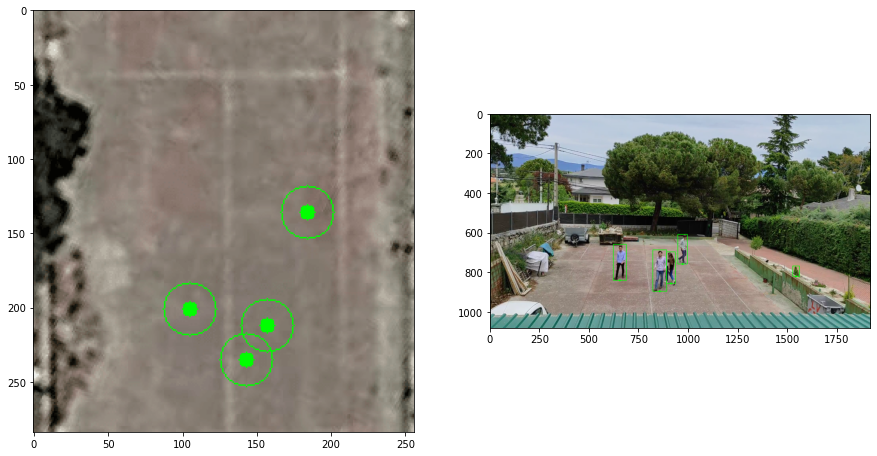

In [ ]:
f, axarr = plt.subplots(1,2,figsize=(15,15))
axarr[0].imshow(cv2.cvtColor(ground_img, cv2.COLOR_BGR2RGB))
axarr[1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

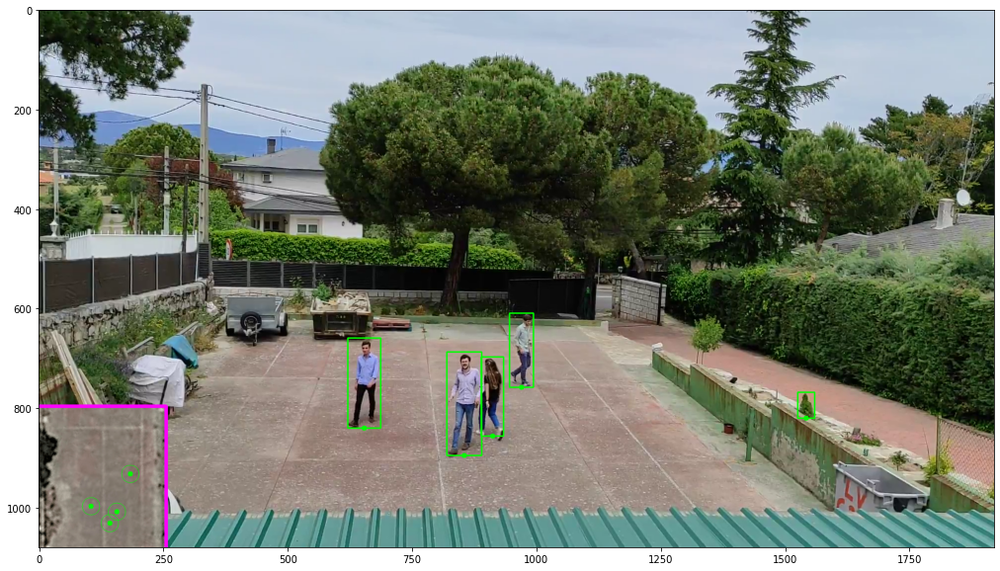

In [ ]:
# Add the eye-bird image
img[(img.shape[0] - ground_img.shape[0]):, :ground_img.shape[1], :] = ground_img
cv2.line(img, (0, (img.shape[0] - ground_img.shape[0])), (ground_img.shape[1], (img.shape[0] - ground_img.shape[0])), (255, 0, 255), thickness=5)
cv2.line(img, (ground_img.shape[1], (img.shape[0] - ground_img.shape[0])), (ground_img.shape[1], img.shape[0]), (255, 0, 255), thickness=5)


plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [ ]:
def compute_distance(midpoints, num):
    '''
    Define a function that computes the distance between all the detected points
    '''
    dist = np.zeros((num, num))
    for i in range(num):
        for j in range(i + 1, num):
            if i != j:
                dst = distance.euclidean(midpoints[i], midpoints[j])
                dist[i][j] = dst
                
    return dist

In [ ]:
# Map the midpoints to real meters to compute the distances
transformed_midpoints_meters = []
for p in transformed_points_ground:
    print(p)
    transformed_midpoints_meters.append(map_locations(p, *ground_img.shape[:2], real_dist_m[0], real_dist_m[1], integer=False))

transformed_midpoints_meters

[105, 201]
[184, 136]
[143, 235]
[157, 212]
[299, 187]


[[4.044140625, 9.306866197183098],
 [7.086874999999999, 6.297183098591549],
 [5.507734375, 10.881161971830986],
 [6.046953125, 9.816197183098591],
 [11.516171875, 8.658626760563381]]

In [ ]:
dist = compute_distance(transformed_midpoints_meters, num) # num is the number of people present in the frame

In [ ]:
dist

array([[0.        , 4.27976925, 2.14953806, 2.06656139, 7.50009769],
       [0.        , 0.        , 4.84835513, 3.66945468, 5.01947079],
       [0.        , 0.        , 0.        , 1.19369463, 6.40632375],
       [0.        , 0.        , 0.        , 0.        , 5.59037772],
       [0.        , 0.        , 0.        , 0.        , 0.        ]])

In [ ]:
def find_closest(dist,num,thresh):
    '''
    Define a function that returns the closest people based on the given proximity distance
    '''
    p1 = []
    p2 = []
    d = []
    for i in range(num):
        for j in range(i, num):
            if((i != j) & (dist[i][j] <= thresh)):
                p1.append(i)
                p2.append(j)
                d.append(dist[i][j])

    return p1,p2,d

In [ ]:
# Set the threshold for the proximity distance
p1, p2, d=find_closest(dist, num, thresh)
df = pd.DataFrame({'p1':p1, 'p2':p2, 'dist':d})
df

,p1,p2,dist
0,2,3,1.193695


In [ ]:
def change_2_red(img, person, p1, p2):
    '''
    Define a function to change the color of the closest people to red
    '''
    risky = np.unique(p1 + p2)
    for i in risky:
        draw_bboxes(img, person, i, color=(0,0,255))
        draw_bboxes(img, person, i, color=(0,0,255))
    return img

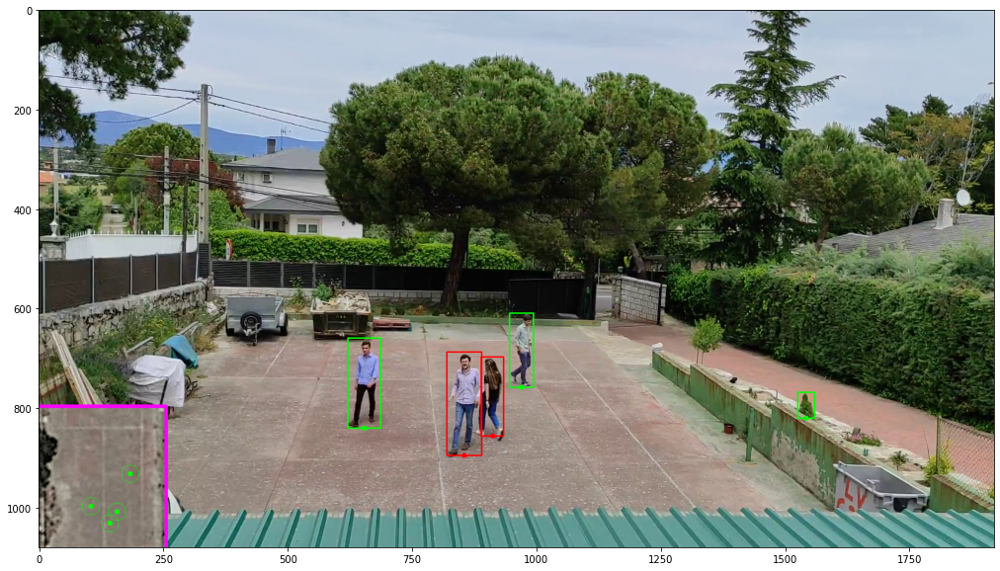

In [ ]:
img = change_2_red(img,person,p1,p2)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

## Put all together

In [ ]:
names = os.listdir('frames/')
names.sort(key=lambda f: int(re.sub('\D', '', f)))

In [ ]:
def find_closest_people(name, thresh, real_dist_m, pts, ground_img):
    '''
    Define a function that process one frame to detect people in it and measure
    the distance between detected people
    '''
    img = cv2.imread('frames/' + name)

    # Predict the location of the persons on the image
    outputs = predictor(img)
    classes = outputs['instances'].pred_classes.cpu().numpy()
    bbox = outputs['instances'].pred_boxes.tensor.cpu().numpy()
    ind = np.where(classes==0)[0]

    # Get only persons
    person = bbox[ind]

    # Get the location of the person on the ground
    midpoints = [mid_point(img,person,i) for i in range(len(person))]
    num = len(midpoints)

    matrix, warped = four_point_transform(img, pts)
    transformed_midpoints = compute_point_perspective_transformation(matrix, midpoints)

    transformed_midpoints_ground = []
    transformed_midpoints_meters = []
    for p in transformed_midpoints:
        transformed_point = map_locations(p.copy(), *warped.shape[:2], *ground_img.shape[:2])
        transformed_midpoints_ground.append(transformed_point)
        transformed_midpoints_meters.append(map_locations(transformed_point.copy(), *ground_img.shape[:2], *real_dist_m, integer=False))

    dist = compute_distance(transformed_midpoints_meters, num)
    p1, p2, d = find_closest(dist, num, thresh)

    img = change_2_red(img, person, p1, p2)
  
    # Check if 2 or more people have been detected (otherwise no need to detect)
    for i, p in enumerate(person):
        color = (0, 0, 255) if i in np.unique(p1 + p2) else (0, 255, 0)

        # Draw the bounding boxes
        x1,y1,x2,y2 = person[i]
        _ = cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
        _ = cv2.circle(img, midpoints[i], 5, color, -1)

        # Draw circles in the mini map
        p = transformed_midpoints_ground[i]
        cv2.circle(ground_img, (p[0], p[1]), radius=5, color=color, thickness=-1)
        cv2.circle(ground_img, (p[0], p[1]), radius=int(pixels_per_meter * (thresh / 2)), color=color, thickness=1)

    img[(img.shape[0] - ground_img.shape[0]):, :ground_img.shape[1], :] = ground_img

    cv2.line(img, (0, (img.shape[0] - ground_img.shape[0])), (ground_img.shape[1], (img.shape[0] - ground_img.shape[0])), (255, 0, 255), thickness=5)
    cv2.line(img, (ground_img.shape[1], (img.shape[0] - ground_img.shape[0])), (ground_img.shape[1], img.shape[0]), (255, 0, 255), thickness=5)

    cv2.imwrite('frames_processed/' + name, cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    # plt.figure(figsize=(20,10))
    # plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    # plt.show()
    return None


In [ ]:
pts = np.zeros((4, 2), dtype = "float32")
pts[0] = np.array([330, 650], dtype = "float32")
pts[1] = np.array([1100, 650], dtype = "float32")
pts[2] = np.array([1600, 1000], dtype = "float32")
pts[3] = np.array([0, 1000], dtype = "float32")

ground_img = cv2.imread("capture_maps.png")

# Real distance of the selected surface by pts in meters
real_dist_m = (13.15, 9.86)
thresh = 1.5 # In meters

pixels_per_meter = round(np.mean([ground_img.shape[0] / real_dist_m[0], ground_img.shape[1] / real_dist_m[1]]))

from tqdm import tqdm
_ = [find_closest_people(names[i], thresh, real_dist_m, pts, ground_img.copy()) for i in tqdm(range(len(names)))]

100%|██████████| 750/750 [06:36<00:00,  1.89it/s]


In [ ]:
# Generate the video
%%time
frames = os.listdir('frames_processed/')
frames.sort(key=lambda f: int(re.sub('\D', '', f)))

frame_array=[]

for i in range(len(frames)):
    # Reading each files
    img = cv2.imread('frames_processed/' + frames[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    height, width, layers = img.shape
    size = (width, height)
    
    # Inserting the frames into an image array
    frame_array.append(img)

out = cv2.VideoWriter('custom_sample_output.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 25, size)
 
for i in range(len(frame_array)):
    # Writing to a image array
    out.write(frame_array[i])

out.release()

CPU times: user 56.6 s, sys: 5.01 s, total: 1min 1s
Wall time: 1min 23s
